# Mean Absolute Error: Curitiba House Price Valuations (Agente Imovel)

The aim is to look at the property prices for the city of Curitiba that were generated with thw AVM and then to understand the error.

We have an automated report that contains the prices per neighborhood, but in Agente Imovel we can only test against the market price per bedroom. Therefore, in this analysis we we take the data offline and compare against the market prices by the property area as well as the number of bedrooms.

In [1]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import sidetable as stb
import datetime
import os
import uuid
import plotly.express as px
pd.set_option("display.max_columns",None)

# Read Datasets

In [2]:
df = pd.read_csv(r"P:\Data (adam)\Agente Imovel Team Support\AVM Test\Curitiba\Curitba Reports Export 2024-11-04.csv",
                encoding='utf-8', parse_dates=['created_at'])
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.lan, df.lat, crs="EPSG:4326"))

In [3]:
gdf.head()

,created_at,id,formatted_address,useful_area,bedrooms,bathrooms,parking_space,property_type,year_built,price_market,price_psqm,rent,rental_yield,calculation_source,lat,lan,neighborhood,neighborhood_id,geometry
0,2024-10-19 22:43:38,a1885bab-1963-46a3-811c-1bba8d12e431,"Abranches, Curitiba - PR, 82130-090, Brasil",180,3,3,3,Casa,1985,739684.0,4109.36,3780.0,6.2,PropdoApi,-25.382390,-49.270045,Abranches,4f43aa71e76c265ccbb0451a26d5b821,POINT (-49.27004 -25.38239)
1,2024-10-19 22:47:06,b35d914e-f573-4869-aba8-5c13be7075d5,"Abranches, Curitiba - PR, 82130-090, Brasil",180,3,3,3,Casa,1985,739684.0,4109.36,3780.0,6.2,PropdoApi,-25.382390,-49.270045,Abranches,4f43aa71e76c265ccbb0451a26d5b821,POINT (-49.27004 -25.38239)
2,2024-08-20 15:53:37,6eee1102-88de-4b2d-8f4d-3880586d7989,"Ac. Valdir Faustino de Souza - Cajuru, Curitib...",70,2,1,0,Casa,2010,282370.0,4033.86,1610.0,6.9,NaN,-25.459834,-49.197801,Cajuru,2750ef61628e59e86fbcad7391f85d26,POINT (-49.19780 -25.45983)
3,2024-10-17 09:11:24,59564cd8-56b5-4bcd-9de0-2eb933311e5a,"Alameda Dr. Carlos de Carvalho - Centro, Curit...",40,1,1,0,Flat,2020,260719.0,6517.98,1880.0,8.7,PropdoApi,-25.433693,-49.281652,Centro,f5da3987b2e46348a1290ab67941445c,POINT (-49.28165 -25.43369)
4,2024-10-17 20:05:21,1aeaa961-1d6a-4a65-8fe7-78653b089682,"Alameda Dr. Carlos de Carvalho, 1461 - Centro,...",91,3,3,1,Apartamento,1982,883598.0,9709.87,2912.0,4.0,PropdoApi,-25.436774,-49.288537,Centro,f5da3987b2e46348a1290ab67941445c,POINT (-49.28854 -25.43677)


In [4]:
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 331 entries, 0 to 330
Data columns (total 19 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   created_at          331 non-null    datetime64[ns]
 1   id                  331 non-null    object        
 2   formatted_address   331 non-null    object        
 3   useful_area         331 non-null    int64         
 4   bedrooms            331 non-null    int64         
 5   bathrooms           331 non-null    int64         
 6   parking_space       331 non-null    int64         
 7   property_type       331 non-null    object        
 8   year_built          331 non-null    int64         
 9   price_market        331 non-null    float64       
 10  price_psqm          331 non-null    float64       
 11  rent                331 non-null    float64       
 12  rental_yield        331 non-null    float64       
 13  calculation_source  197 non-null    object

In [5]:
gdf[gdf['neighborhood_id'].isna()].head()

,created_at,id,formatted_address,useful_area,bedrooms,bathrooms,parking_space,property_type,year_built,price_market,price_psqm,rent,rental_yield,calculation_source,lat,lan,neighborhood,neighborhood_id,geometry
39,2024-10-04 20:26:47,29e39d4c-e455-40c8-93be-f319a2db5f84,"Curitiba, PR, Brasil",45,2,2,1,Casa,2016,285654.0,6347.87,2115.0,8.9,PropdoApi,-25.426899,-49.265198,NaN,NaN,POINT (-49.26520 -25.42690)
224,2024-08-01 10:59:20,0e2884f2-676e-496e-9688-2c6187887fea,"R. Prof. Brandão - Alto da XV, Curitiba - PR, ...",89,3,2,1,Apartamento,1970,528369.0,5936.73,2759.0,6.3,NaN,-25.424303,-49.249099,Alto da XV,NaN,POINT (-49.24910 -25.42430)
237,2024-09-08 21:47:56,9c4a1919-0bb8-4edf-84f9-457a0b5c652b,"R. Rosa Kaint Nadolny, 60 - Ecoville, Curitiba...",87,3,2,2,Apartamento,2024,781574.0,8983.61,2523.0,3.9,NaN,-25.437690,-49.337232,Ecoville,NaN,POINT (-49.33723 -25.43769)
257,2024-10-15 13:10:38,8a332235-d419-4f7c-aad2-c7439e093f48,"R. XV de Novembro, 2923 - Alto da XV, Curitiba...",110,3,2,1,Apartamento,1974,887430.0,8059.49,2753.0,3.8,PropdoApi,-25.427255,-49.245531,Alto da XV,NaN,POINT (-49.24553 -25.42726)
258,2024-10-15 12:02:21,b448f081-8263-4b20-85ff-314374618744,"R. XV de Novembro, 2923 - Alto da XV, Curitiba...",111,3,2,1,Apartamento,1970,887430.0,7987.67,2778.0,3.8,PropdoApi,-25.427255,-49.245531,Alto da XV,NaN,POINT (-49.24553 -25.42726)


In [6]:
print(gdf.duplicated().sum())

0


After overviewing the data we need to ensure we are not missing any neighbourhoods and we will fill them in by joining the neighbourhood from the shape file to ensure nothing has been missed out. Other missing values such as calculation source was only added a week ago and the other ones are for optional fields on the website.

# Data Preprocessing

### 1. Fill in Missing Neighborhoods

In [7]:
bairros_df = gpd.read_parquet(r"P:\Data Engineering\Data\br_new\Dev\Git Branch\br_new_structure\Provisional\Formatted Features\curitiba\neighborhood.parquet")

gdf=gpd.sjoin(gdf, bairros_df, predicate='within')

In [8]:
gdf[gdf['neighborhood_id_left'].isna()].head()

,created_at,id,formatted_address,useful_area,bedrooms,bathrooms,parking_space,property_type,year_built,price_market,price_psqm,rent,rental_yield,calculation_source,lat,lan,neighborhood_left,neighborhood_id_left,geometry,index_right,neighborhood_id_right,neighborhood_right
320,2024-08-24 15:10:13,7aa666c1-c71c-4a1f-8e4e-2abc0fbb69e4,"Rua Professora Olga Balster - Cajuru, Curitiba...",60,2,1,0,Casa,2010,267183.0,4453.05,1380.0,6.2,NaN,-25.441461,-49.219637,NaN,NaN,POINT (-49.21964 -25.44146),61,2750ef61628e59e86fbcad7391f85d26,Cajuru
39,2024-10-04 20:26:47,29e39d4c-e455-40c8-93be-f319a2db5f84,"Curitiba, PR, Brasil",45,2,2,1,Casa,2016,285654.0,6347.87,2115.0,8.9,PropdoApi,-25.426899,-49.265198,NaN,NaN,POINT (-49.26520 -25.42690),49,f5da3987b2e46348a1290ab67941445c,Centro
263,2024-10-27 21:09:42,31cc8724-c3f5-47d8-a241-c6742f31212d,"Rua Antônio Escorsin, Curitiba - PR, 81020-490...",103,3,3,1,Apartamento,1991,595967.0,5786.09,2060.0,4.2,PropdoApi,-25.417522,-49.345935,NaN,NaN,POINT (-49.34593 -25.41752),71,5176120396b31a2b976776834f51d08e,São Braz
264,2024-10-27 21:06:56,80b35356-d4aa-404c-b958-a2e33c9975bf,"Rua Antônio Escorsin, Curitiba - PR, 81020-490...",103,3,3,1,Apartamento,1990,595967.0,5786.09,2060.0,4.2,PropdoApi,-25.417522,-49.345935,NaN,NaN,POINT (-49.34593 -25.41752),71,5176120396b31a2b976776834f51d08e,São Braz
237,2024-09-08 21:47:56,9c4a1919-0bb8-4edf-84f9-457a0b5c652b,"R. Rosa Kaint Nadolny, 60 - Ecoville, Curitiba...",87,3,2,2,Apartamento,2024,781574.0,8983.61,2523.0,3.9,NaN,-25.437690,-49.337232,Ecoville,NaN,POINT (-49.33723 -25.43769),11,1f9495181c0cd35596040d993c086238,Campo Comprido


In [9]:
gdf.drop(columns=['neighborhood_id_left','neighborhood_left'],inplace=True)

gdf.rename(columns={'neighborhood_id_right':'neighborhood_id','neighborhood_right':'neighborhood'},inplace=True)

In [10]:
# Fill nan with PropdoApi as the column wasn't added to the database until a few weeks ago, but we know it's ours.
gdf['calculation_source'].fillna('PropdoApi',inplace=True)

### 2. Remove Duplicate Reports

In [11]:
print(gdf.duplicated(subset=['formatted_address', 'bedrooms', 'bathrooms', 'useful_area','property_type',
                       'price_market', 'price_psqm']).sum())

30


In [12]:
gdf[gdf.duplicated(subset=['formatted_address', 'bedrooms', 'bathrooms', 'useful_area','property_type',
                       'price_market', 'price_psqm'],keep='first')]

,created_at,id,formatted_address,useful_area,bedrooms,bathrooms,parking_space,property_type,year_built,price_market,price_psqm,rent,rental_yield,calculation_source,lat,lan,geometry,index_right,neighborhood_id,neighborhood
1,2024-10-19 22:47:06,b35d914e-f573-4869-aba8-5c13be7075d5,"Abranches, Curitiba - PR, 82130-090, Brasil",180,3,3,3,Casa,1985,739684.0,4109.36,3780.0,6.2,PropdoApi,-25.382390,-49.270045,POINT (-49.27004 -25.38239),50,4f43aa71e76c265ccbb0451a26d5b821,Abranches
36,2024-10-16 14:24:06,48b74bfc-3012-418f-9096-960d1674fc7d,Condomínio Edifício Terra do Fogo - R. Petit C...,155,3,4,2,Apartamento,2001,1483621.0,9571.75,4495.0,3.7,PropdoApi,-25.453322,-49.289124,POINT (-49.28912 -25.45332),0,b3246b43c6a765df0282a93353a68889,Água Verde
37,2024-10-29 08:16:23,9edfbfe3-b777-4792-ad77-a8a6f4f1413d,Condomínio Edifício Terra do Fogo - R. Petit C...,155,3,4,2,Apartamento,2002,1483621.0,9571.75,4495.0,3.7,PropdoApi,-25.453322,-49.289124,POINT (-49.28912 -25.45332),0,b3246b43c6a765df0282a93353a68889,Água Verde
70,2024-08-19 17:39:06,6bf8c3ae-1200-4b58-941f-74ac1ad2cc99,"R. Brg. Franco, 4054 - Água Verde, Curitiba - ...",78,3,2,1,Apartamento,2004,531153.0,6809.65,2496.0,5.7,PropdoApi,-25.455294,-49.270525,POINT (-49.27053 -25.45529),0,b3246b43c6a765df0282a93353a68889,Água Verde
264,2024-10-27 21:06:56,80b35356-d4aa-404c-b958-a2e33c9975bf,"Rua Antônio Escorsin, Curitiba - PR, 81020-490...",103,3,3,1,Apartamento,1990,595967.0,5786.09,2060.0,4.2,PropdoApi,-25.417522,-49.345935,POINT (-49.34593 -25.41752),71,5176120396b31a2b976776834f51d08e,São Braz
26,2024-10-03 17:31:56,88de0af6-bf12-4183-91bd-f0660e6e3682,"BR-116, 2785 - Bairro Alto, Curitiba - PR, 825...",50,2,1,1,Apartamento,2019,271133.0,5422.66,1300.0,5.8,PropdoApi,-25.397185,-49.212692,POINT (-49.21269 -25.39719),5,58f451303dbd29db41734756b82a9e81,Bairro Alto
27,2024-10-10 20:08:05,bdaed83e-ba30-430d-aa55-7dbf8e951689,"BR-116, 2785 - Bairro Alto, Curitiba - PR, 825...",50,2,1,1,Apartamento,2014,271133.0,5422.66,1300.0,5.8,PropdoApi,-25.397185,-49.212692,POINT (-49.21269 -25.39719),5,58f451303dbd29db41734756b82a9e81,Bairro Alto
50,2024-10-09 17:02:12,bc4c473f-e18b-43ce-b130-0cb81b74b826,"R. Amadeu Natal - Santa Cândida, Curitiba - PR...",83,3,2,2,Casa,1983,418432.0,5041.35,1909.0,5.5,PropdoApi,-25.369488,-49.246473,POINT (-49.24647 -25.36949),65,8bf0ca860f8390f14bf1d28c252d1fc6,Santa Cândida
55,2024-09-19 14:06:12,ed68fdb9-d9b3-4d1a-8fcd-8f95b94abf42,"R. Ângelo Zamir Biasi - Atuba, Curitiba - PR, ...",120,3,3,2,Casa,2000,584989.0,4874.91,2520.0,5.2,PropdoApi,-25.383989,-49.211482,POINT (-49.21148 -25.38399),8,097b05e27dec23f9a011d158e2594ea9,Atuba
325,2024-10-10 09:50:33,c92695b4-442b-4774-9604-0e0936a60937,"Rua Theóphilo Augusto Loyola Guimarães, 116 - ...",224,3,4,3,Casa,2015,711617.0,3176.86,4480.0,7.6,PropdoApi,-25.383712,-49.214757,POINT (-49.21476 -25.38371),8,097b05e27dec23f9a011d158e2594ea9,Atuba


In [13]:
gdf[gdf['formatted_address'] == 'Abranches, Curitiba - PR, 82130-090, Brasil']

,created_at,id,formatted_address,useful_area,bedrooms,bathrooms,parking_space,property_type,year_built,price_market,price_psqm,rent,rental_yield,calculation_source,lat,lan,geometry,index_right,neighborhood_id,neighborhood
0,2024-10-19 22:43:38,a1885bab-1963-46a3-811c-1bba8d12e431,"Abranches, Curitiba - PR, 82130-090, Brasil",180,3,3,3,Casa,1985,739684.0,4109.36,3780.0,6.2,PropdoApi,-25.38239,-49.270045,POINT (-49.27004 -25.38239),50,4f43aa71e76c265ccbb0451a26d5b821,Abranches
1,2024-10-19 22:47:06,b35d914e-f573-4869-aba8-5c13be7075d5,"Abranches, Curitiba - PR, 82130-090, Brasil",180,3,3,3,Casa,1985,739684.0,4109.36,3780.0,6.2,PropdoApi,-25.38239,-49.270045,POINT (-49.27004 -25.38239),50,4f43aa71e76c265ccbb0451a26d5b821,Abranches


In [14]:
gdf.drop_duplicates(subset=['formatted_address', 'bedrooms', 'bathrooms', 'useful_area','property_type',
                            'price_market', 'price_psqm'],keep='first', inplace=True)

### 3. Add categories for the Test against market prices

In [15]:
def bedroom_cat(bedrooms):
    
    if bedrooms == 1:
        return '1'
    elif bedrooms == 2:
        return '2'
    elif bedrooms == 3:
        return '3'
    elif bedrooms == 4:
        return '4'
    elif bedrooms >= 5:
        return '5+'
    else: return np.nan
    
gdf['bedrooms_cat'] = gdf['bedrooms'].apply(bedroom_cat)

gdf['property_type_match'] = gdf['property_type'].replace({'Casa': 'HOME', 
                                                           'Apartamento': 'APARTMENT', 
                                                           'Flat':'APARTMENT', 
                                                           'Kitnet':'APARTMENT'
})

def sqm_category(sqm):
    if sqm < 30:
        return 'up to 30'
    elif sqm < 60:
        return '30 to 60'
    elif sqm < 100:
        return '60 to 100'
    elif sqm < 150:
        return '100 to 150'
    elif sqm < 250:
        return '150 to 250'
    elif sqm < 500:
        return '250 to 500'
    elif sqm < 850:
        return '500 to 850'
    elif sqm < 1000:
        return '850 to 1000'
    else:
        return 'Over 1000'

gdf['sqm_category']=gdf['useful_area'].apply(sqm_category)

### 4. Add Local Market Prices

Infer the market prices from the Agente Imovel website for neighbourhood, type and number of bedrooms to the AVM Results.

Also add metrics to the table.

In [16]:
# Read and add the same categories as I did with the AVM Results (using the latest scraped data)
curitiba_prices = gpd.read_parquet(r"P:\Data Engineering\Data\br_new\Dev\Git Branch\br_new_structure\Provisional\Listings Split\Cleaned\curitiba\Zap Listings 2024-10-14.parquet")
curitiba_prices['sqm_category'] = curitiba_prices['sqm'].apply(sqm_category)
curitiba_prices['bedrooms_cat'] = curitiba_prices['num_bedrooms'].apply(bedroom_cat)
curitiba_prices['unit_type_group'] = curitiba_prices['unit_type'].replace({
    'VILLAGE_HOUSE':'HOME', 'PENTHOUSE':'APARTMENT',
       'TWO_STORY_HOUSE':'HOME', 'FLAT':'APARTMENT'
})

# Create the grouping with the local market prices

sqm_group=curitiba_prices.groupby(['neighborhood_id','unit_type_group','bedrooms_cat','sqm_category']).agg({'price':'mean', 'ppsqm':'mean','prop_id':'count'}).reset_index()
sqm_group.columns = ['neighborhood_id','unit_type','beds_cat','sqm_category','price_mean','ppsqm_mean','count']

In [17]:
sqm_group.head()

,neighborhood_id,unit_type,beds_cat,sqm_category,price_mean,ppsqm_mean,count
0,02760bf5df8209f1920059f009c6e812,APARTMENT,1,30 to 60,177154.166667,5873.469534,6
1,02760bf5df8209f1920059f009c6e812,APARTMENT,1,up to 30,183315.250000,6934.943545,5
2,02760bf5df8209f1920059f009c6e812,APARTMENT,2,100 to 150,589572.750000,4716.582000,1
3,02760bf5df8209f1920059f009c6e812,APARTMENT,2,30 to 60,357878.115385,6977.002291,78
4,02760bf5df8209f1920059f009c6e812,APARTMENT,2,60 to 100,375788.931250,5888.154545,24


### 5. Add the market prices to the AVM Results

In [18]:
merge_prices=pd.merge(gdf, sqm_group, 
                      left_on=['neighborhood_id',
                               'property_type_match',
                               'bedrooms_cat',
                               'sqm_category'],
                      right_on=['neighborhood_id',
                                'unit_type',
                                'beds_cat',
                                'sqm_category'], how='left')

### 5.1. Remove the missing prices & ensure no calculation by 0

Price is already not null, but this is just to verify as sometimes are data for Brazil has 0 Real.

In [19]:
merge_prices=merge_prices.dropna(subset='price_market')
merge_prices=merge_prices.dropna(subset='price_mean')

merge_prices = merge_prices[merge_prices['price_mean'] != 0].copy()
merge_prices = merge_prices[merge_prices['rent'] != 0].copy()

merge_prices['mape'] = abs((merge_prices['price_market'] - merge_prices['price_mean'])
                                       / merge_prices['price_mean'])
merge_prices['absolute_error'] = abs(merge_prices['price_market'] - merge_prices['price_mean'])

merge_prices['user_error'] = (merge_prices['price_market'] - merge_prices['price_mean'])

In [20]:
merge_prices['mape'].mean()

0.19110193289301944

In [21]:
merge_prices['absolute_error'].mean()

187758.70823270438

In [22]:
# Print a final overview.
merge_prices.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 286 entries, 0 to 300
Data columns (total 31 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   created_at           286 non-null    datetime64[ns]
 1   id                   286 non-null    object        
 2   formatted_address    286 non-null    object        
 3   useful_area          286 non-null    int64         
 4   bedrooms             286 non-null    int64         
 5   bathrooms            286 non-null    int64         
 6   parking_space        286 non-null    int64         
 7   property_type        286 non-null    object        
 8   year_built           286 non-null    int64         
 9   price_market         286 non-null    float64       
 10  price_psqm           286 non-null    float64       
 11  rent                 286 non-null    float64       
 12  rental_yield         286 non-null    float64       
 13  calculation_source   286 non-nul

The majority of the properties that we lost in the cleaning were the 30 duplicate addresses and prices that came out of the evaluation system.

# Explore Data

Understanding the Error Levels

- Explore the Mean Absolute Error for Curitiba to get a quick overview of the results.

- Understand which neighborhoods have the highest mean eror and highlight the top 10 good and bad areas.

- Visual on the map the error percentage by neighbourhood in Curitiba and show the main areas.

Correlation between data quantity and error percentage

- Is there an correlation between the count of properties (in the market data) and the absolute error?

- Is there any correlation between the number of bedrooms and the error percentage and how does it compare with the property area correlation between prices?

## 1. How does the price evaluation perform on a whole?

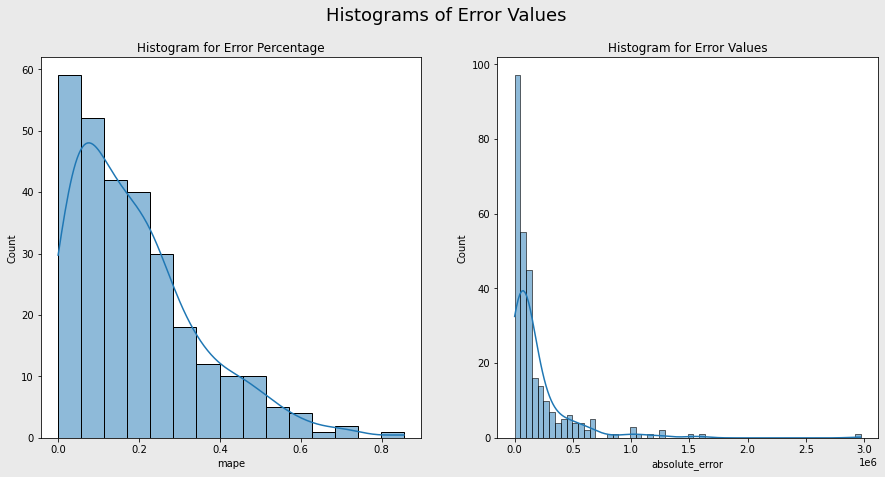

In [23]:
fig, ax = plt.subplots(1, 2, figsize=(15, 7), facecolor='#EAEAEA')

# Plot MAPE histogram
sns.histplot(data=merge_prices, x='mape', kde=True, ax=ax[0])
title1 = 'Histogram for Error Percentage'
ax[0].set_title(title1)

# Plot MAE histogram
sns.histplot(data=merge_prices, x='absolute_error', kde=True, ax=ax[1])
title2 = 'Histogram for Error Values'
ax[1].set_title(title2)

# Set a common title for the figure
fig.suptitle('Histograms of Error Values', fontsize=18)

plt.show()

Conclusion

- The percentage absolute error for Curitiba properties displays a good positive right skewed distributions with the majority of the error percentages beinf 20% or below which is reflexed in the mean for the whole city.

- For the mean error currency value, the total is mostly low, with values below 250000 and only very few outliers above 50000 BRL for the city as a whole.

## 2. Neighborhood Level Analysis

1) Which neighborhoods were most popular ?

2) What is the error level for our most popular neighbourhoods? 

In [24]:
popular_bairros=merge_prices.groupby('neighborhood').agg({'id':'count','mape':'mean'}).reset_index()
popular_bairros.columns = ['neighborhood', 'reports', 'mean_error']
popular_bairros.sort_values(by='reports',ascending=False).head(10)

,neighborhood,reports,mean_error
35,Novo Mundo,24,0.250469
55,Água Verde,18,0.181949
20,Centro,13,0.184320
38,Portão,12,0.224429
22,Cidade Industrial De Curitiba,11,0.226105
27,Hauer,10,0.116881
41,Santa Felicidade,8,0.158088
14,Cajuru,8,0.167611
53,Vista Alegre,8,0.149780
36,Pilarzinho,8,0.276574


## 2.1. Take the Top 5 most popular neighborhoods

- What is the situation for large properties over 5 bedrooms compared to properties with 1 bedrooms?

In [25]:
top_three_df = merge_prices[merge_prices['neighborhood'].isin(['Novo Mundo',
                                                  'Água Verde','Centro','Portão',
                                                  'Cidade Industrial De Curitiba'])]

In [26]:
main_bairro_group=top_three_df[top_three_df['unit_type'] == 'APARTMENT'].groupby(
    ['beds_cat','sqm_category']).agg({'mape':'mean','absolute_error':'mean','user_error':'mean',
                                      'id':'count'}).reset_index()
main_bairro_group.columns = ['beds','area','abs_error_pct','abs_error','user_error','total_reports']
main_bairro_group.sort_values(by='abs_error_pct',ascending=False)

,beds,area,abs_error_pct,abs_error,user_error,total_reports
2,2,100 to 150,0.471626,474422.780000,-474422.780000,1
6,3,150 to 250,0.392282,811323.427606,-811323.427606,5
0,1,100 to 150,0.319125,500730.375000,-500730.375000,1
5,3,100 to 150,0.316322,324048.180396,-324048.180396,8
7,3,30 to 60,0.225846,77519.206897,77519.206897,1
4,2,60 to 100,0.219233,134571.581454,-134571.581454,3
10,4,150 to 250,0.192505,361154.454473,-361154.454473,1
3,2,30 to 60,0.158953,62643.294020,-62104.620035,10
1,1,30 to 60,0.137159,46215.004200,-24278.829222,8
8,3,60 to 100,0.101814,54073.412436,-41548.487099,9


Popular neighbourhoods Conclusion - APARTAMENTOS


- Properties with 1 to 3 bedrooms and over 100 square meters had the highest error rates, likely due to the variability in price per square meter for larger units in these configurations.
- Smaller apartments (1 & 3 bedrooms) with sizes between 30-100 square meters showed the most accurate predictions, along with 4-bedroom units within 100-150 sqm, suggesting the model handles these typical property types well.
- Large one- and two-bedroom apartments over 100 sqm may benefit from specific model adjustments, as they currently exhibit the highest errors, possibly due to fewer comparable listings and a different value structure.

In [27]:
main_bairro_casa_group=top_three_df[top_three_df['unit_type'] == 'HOME'].groupby(
    ['beds_cat','sqm_category']).agg({'mape':'mean','absolute_error':'mean','user_error':'mean','id':'count'}).reset_index()
main_bairro_casa_group.columns = ['beds','area','abs_error_pct','abs_error','user_error','total_reports']
main_bairro_casa_group.sort_values(by='abs_error_pct',ascending=False)

,beds,area,abs_error_pct,abs_error,user_error,total_reports
1,2,30 to 60,0.583350,116759.666667,33487.666667,2
8,5+,250 to 500,0.413473,534044.692308,-534044.692308,1
6,4,100 to 150,0.371693,175624.653846,-175624.653846,1
0,2,100 to 150,0.331338,133400.875000,133400.875000,1
7,4,150 to 250,0.258543,245672.792770,-159892.221493,6
4,3,250 to 500,0.197261,198763.750000,82309.750000,4
5,3,60 to 100,0.194838,91760.289871,-68163.772629,3
3,3,150 to 250,0.140202,118840.875948,-7317.282117,5
2,3,100 to 150,0.134110,87856.755539,-75341.787682,7


Popular Neighborhoods - Casas

- High Error Segments: Properties with 5+ bedrooms over 250 sqm had significant errors, with valuation discrepancies exceeding half a million. This may be due to the relative rarity or unique market dynamics of such large properties. Similarly, smaller 2-bedroom houses up to 60 sqm showed a 58% valuation error, suggesting the model might not capture pricing well for these compact homes.
- Strong Performance for Mid-Size Homes: In contrast, 3-bedroom houses between 60 and 500 sqm showed a strong performance, with an average error rate below 20% (approximately 80% accuracy). This may reflect the model's ability to better predict prices for mid-size, more common property types.

Potential Improvements (both types): 

- Given these findings, the model could benefit from refining its approach for less typical configurations, such as luxury or very compact homes, to improve overall accuracy in these categories.

- The model needs to be adjusted on the website by adding a percentage increase or decrease based on property age, condition and whether the property is on a higher or lower floor.

### 2.2. Heatmap of Neighbourhood Error

In [28]:
bairro_mean_error=merge_prices.groupby(
    ['neighborhood_id']).agg({'mape':'mean','absolute_error':'mean','user_error':'mean','id':'count'})
bairro_map=pd.merge(bairros_df,bairro_mean_error, on='neighborhood_id',how='left').fillna(0)
bairro_map_gdf = gpd.GeoDataFrame(bairro_map, geometry='geometry', crs='EPSG:3857')

# Ensure bairro_map is a GeoDataFrame and convert it to GeoJSON-like structure
bairro_map_json = bairro_map_gdf.__geo_interface__

# Plotting with plotly
fig = px.choropleth_mapbox(
    bairro_map,
    geojson=bairro_map_json,
    locations="neighborhood_id",
    featureidkey="properties.neighborhood_id",
    color="mape",
    color_continuous_scale="reds",
    range_color=(0.35,0.5),
    mapbox_style="carto-positron",
    zoom=10,
    hover_name = 'neighborhood',
    center={"lat": bairro_map_gdf.geometry.centroid.y.mean(), "lon": bairro_map_gdf.geometry.centroid.x.mean()},
    labels={'mape': 'Mean Absolute Percentage Error','count':'total reports'},
    opacity=0.5
)

fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

The heatmap above highlights, the neighbourhoods with the most critical errors across the city of Curitiba. Which are over 35%. These are Sao Fransisco, Sao Lorenco and Santo Ignacio.

## Data Quanity & Percentage Error

Is there an correlation between the count of properties (in the market data) and the absolute error?

### Correlation between property count & percentage error in Curitiba

In [29]:
merge_prices.head()

,created_at,id,formatted_address,useful_area,bedrooms,bathrooms,parking_space,property_type,year_built,price_market,price_psqm,rent,rental_yield,calculation_source,lat,lan,geometry,index_right,neighborhood_id,neighborhood,bedrooms_cat,property_type_match,sqm_category,unit_type,beds_cat,price_mean,ppsqm_mean,count,mape,absolute_error,user_error
0,2024-10-19 22:43:38,a1885bab-1963-46a3-811c-1bba8d12e431,"Abranches, Curitiba - PR, 82130-090, Brasil",180,3,3,3,Casa,1985,739684.0,4109.36,3780.0,6.2,PropdoApi,-25.382390,-49.270045,POINT (-49.27004 -25.38239),50,4f43aa71e76c265ccbb0451a26d5b821,Abranches,3,HOME,150 to 250,HOME,3,812328.127011,4780.096723,87.0,0.089427,72644.127011,-72644.127011
1,2024-10-29 22:58:17,494a8867-f787-468c-8fb1-1a48f60cfd11,"R. Lúcia Soppelsa de Boni, 41 - Abranches, Cur...",120,3,3,3,Casa,1990,474867.0,3957.23,2640.0,6.7,PropdoApi,-25.355407,-49.276202,POINT (-49.27620 -25.35541),50,4f43aa71e76c265ccbb0451a26d5b821,Abranches,3,HOME,100 to 150,HOME,3,589661.271429,4844.811624,77.0,0.194678,114794.271429,-114794.271429
2,2024-08-20 15:53:37,6eee1102-88de-4b2d-8f4d-3880586d7989,"Ac. Valdir Faustino de Souza - Cajuru, Curitib...",70,2,1,0,Casa,2010,282370.0,4033.86,1610.0,6.9,PropdoApi,-25.459834,-49.197801,POINT (-49.19780 -25.45983),61,2750ef61628e59e86fbcad7391f85d26,Cajuru,2,HOME,60 to 100,HOME,2,352734.545455,4078.580244,11.0,0.199483,70364.545455,-70364.545455
3,2024-07-30 13:27:17,371c02d8-cb20-4b01-8ec3-3e2f1825a94c,"R. Aracaju, 619 - Cajuru, Curitiba - PR, 82930...",34,2,1,0,Apartamento,2021,195698.0,5755.82,1054.0,6.5,PropdoApi,-25.457634,-49.211360,POINT (-49.21136 -25.45763),61,2750ef61628e59e86fbcad7391f85d26,Cajuru,2,APARTMENT,30 to 60,APARTMENT,2,251316.409091,5445.296203,33.0,0.221308,55618.409091,-55618.409091
4,2024-10-18 18:45:15,955f2767-73c8-4ee4-b946-954b60b86c0f,"R. Goiânia - Cajuru, Curitiba - PR, 82940-150,...",183,3,3,3,Casa,2005,566424.0,3091.84,2748.0,5.9,PropdoApi,-25.456793,-49.219520,POINT (-49.21952 -25.45679),61,2750ef61628e59e86fbcad7391f85d26,Cajuru,3,HOME,150 to 250,HOME,3,686675.060241,3829.478153,83.0,0.175121,120251.060241,-120251.060241


In [42]:
merge_prices.sort_values(by=['neighborhood','unit_type','beds_cat','sqm_category'])

data_gap_groups = merge_prices.groupby(
    ['neighborhood','unit_type','sqm_category','beds_cat']).agg({'price_mean':'first',
                                                                 'ppsqm_mean':'first',
                                                                 'count':'first',
                                                                'mape':'mean',
                                                                'absolute_error':'mean',
                                                                'user_error':'mean'}).reset_index()
data_gap_groups.columns = ['neighborhood','unit_type','sqm_category',
                           'beds_cat','market_mean','market_psqm', 'data_count',
                           'mean_error_pct','abs_error_valur','error_pct']
data_gap_groups.head()

,neighborhood,unit_type,sqm_category,beds_cat,market_mean,market_psqm,data_count,mean_error_pct,abs_error_valur,error_pct
0,Abranches,HOME,100 to 150,3,5.896613e+05,4844.811624,77.0,0.194678,114794.271429,-114794.271429
1,Abranches,HOME,150 to 250,3,8.123281e+05,4780.096723,87.0,0.089427,72644.127011,-72644.127011
2,Ahú,APARTMENT,60 to 100,2,8.014353e+05,9609.615397,45.0,0.354230,283892.325556,-283892.325556
3,Ahú,HOME,150 to 250,3,1.145922e+06,5571.480389,35.0,0.166714,191040.962857,-191040.962857
4,Ahú,HOME,250 to 500,3,1.732841e+06,5292.814039,17.0,0.325307,563706.000000,-563706.000000


### Correlation between Total Data Points (in the entire dataset/model) Vs. Accuracy

In [52]:
fig = px.scatter(data_gap_groups, x="mean_error_pct", 
                 y="data_count",color="beds_cat", title='Relationship between data quantity and mean error')
fig.update_layout(
    xaxis_title="Mean Error Percentage",
    yaxis_title="Data Count"
)
fig.show()

Most of the time we have less than 100 properties in our data, but once we start to look at the different number of bedroom types, we can see a significant error growther than 40% when there is a lower count per neighborhood for the said category.

Summary and Conclusion

This analysis evaluated the performance of an automated valuation model (AVM) for property prices in Curitiba, focusing on neighbourhood-level insights, error distributions, and the impact of data quantity on model accuracy.

Overall Model Performance:

The AVM shows a favourable right-skewed error distribution, with most errors falling below 20%. Absolute errors are generally low, with few outliers above BRL 50,000, indicating a reasonable overall model performance.

Neighborhood-Level Insights:

- Popular neighbourhoods like Novo Mundo, Água Verde, and Centro had relatively moderate errors, but outliers were found in neighbourhoods with fewer listings, like São Francisco and São Lourenço. These areas may benefit from additional data to improve accuracy.

- The heatmap visualization highlighted critical neighbourhoods with high error rates, helping prioritize areas for model improvement.

Property Characteristics and Model Accuracy:

- For apartments, the model performs well on typical configurations (1-3 bedrooms within 30-100 sqm), while larger apartments with 1-3 bedrooms over 100 sqm showed the highest errors. The model may need adjustments to handle variability in pricing for these less common configurations.

- For houses, the model performed best on 3-bedroom homes between 60 and 500 sqm. High errors were observed for extensive properties (5+ bedrooms, 250+ sqm) and tiny, compact 2-bedroom homes, indicating the model struggles with atypical configurations.

Impact of Data Quantity on Accuracy:

A positive correlation was observed between data count and accuracy, with categories with more listings generally showing lower errors. This suggests that the model benefits from a higher volume of data, which improves its reliability.

Recommendations for Model Improvement:

- Refine Model for Atypical Configurations: The model could be enhanced by adjusting for luxury or very compact properties, such as large one- or two-bedroom apartments and tiny houses with unique characteristics.
- Incorporate Additional Features: Including property age, condition, and floor level (for apartments) could improve accuracy by accounting for factors that influence valuation but are not yet fully captured by the model.
- Data Expansion in High-Error Neighborhoods: Increasing data collection efforts in neighbourhoods with high error rates and low data counts could further reduce errors and improve model performance in underrepresented areas.